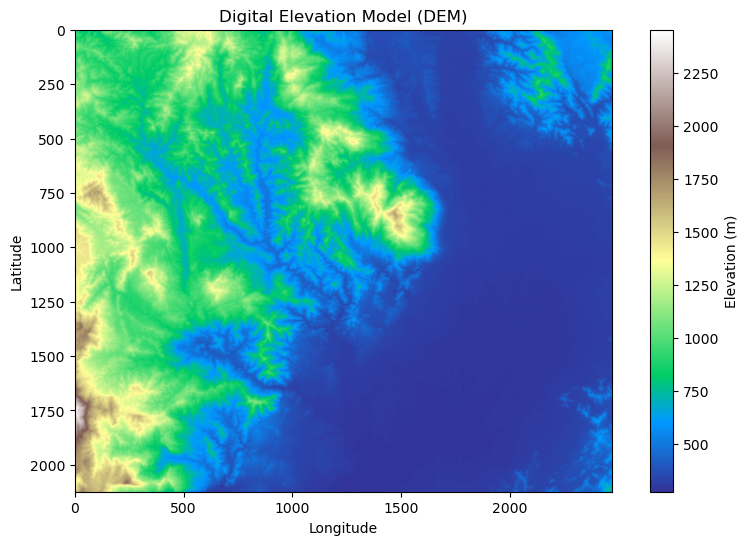

In [41]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Replace 'your_dem_file.tif' with the path to your DEM file
dem_file = './SRTM_DEM2.tif'

# Open the DEM file with Rasterio
with rasterio.open(dem_file) as src:
    dem = src.read(1)  # read the first band into a 2D array

# Plot the DEM using Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(dem, cmap='terrain')
plt.colorbar(label='Elevation (m)')
plt.title('Digital Elevation Model (DEM)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [42]:
from osgeo import gdal
import numpy as np

# Open the DEM file
dataset = gdal.Open(dem_file)
band = dataset.GetRasterBand(1)

# Read the DEM data into a NumPy array
dem_data = band.ReadAsArray().astype(np.float64)


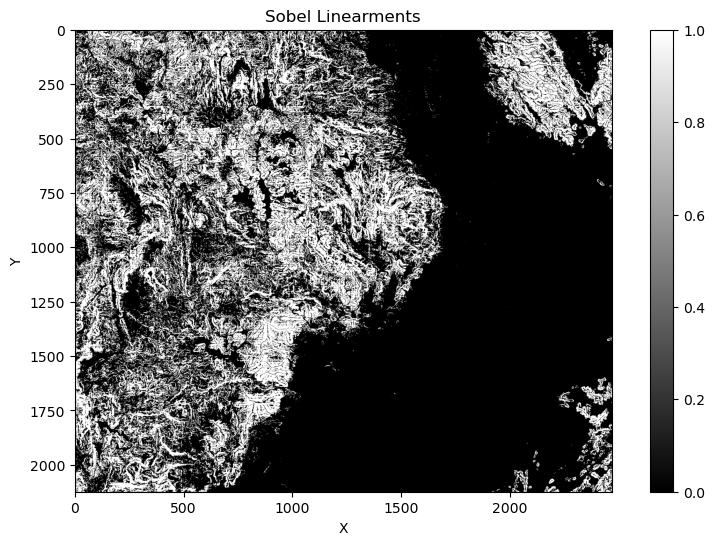

In [43]:
from scipy import ndimage
import matplotlib.pyplot as plt
# Apply the Sobel filter
sobel_horizontal = ndimage.sobel(dem_data, axis=0)
sobel_vertical = ndimage.sobel(dem_data, axis=1)

# Combine the horizontal and vertical edges
sobel_combined = np.hypot(sobel_horizontal, sobel_vertical)

# Define a threshold
threshold = sobel_combined.mean() * 1.5

# Apply the threshold
linearment_candidates = np.where(sobel_combined > threshold, 1, 0)


plt.figure(figsize=(10, 6))
plt.imshow(linearment_candidates, cmap='gray')
plt.title('Sobel Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()


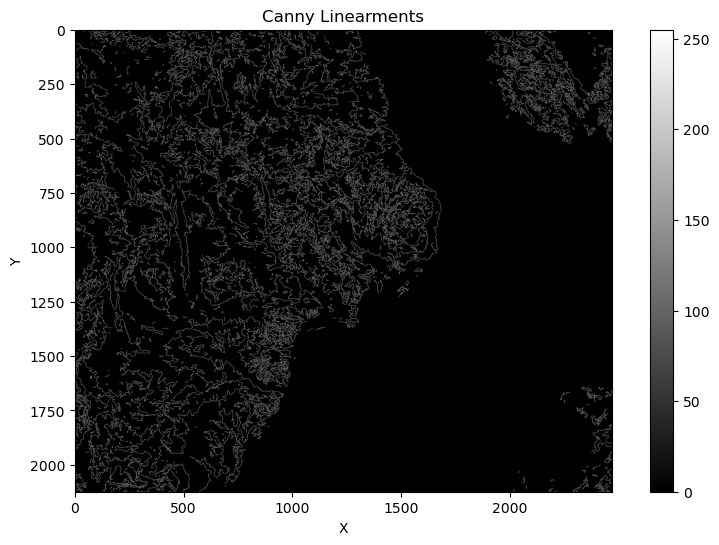

In [44]:
import cv2
import matplotlib.pyplot as plt

# Assuming 'dem_data' is your DEM data loaded as a NumPy array
edges = cv2.Canny(dem_data.astype(np.uint8), threshold1=100, threshold2=200)

plt.figure(figsize=(10, 6))
plt.imshow(edges, cmap='gray')
plt.title('Canny Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()

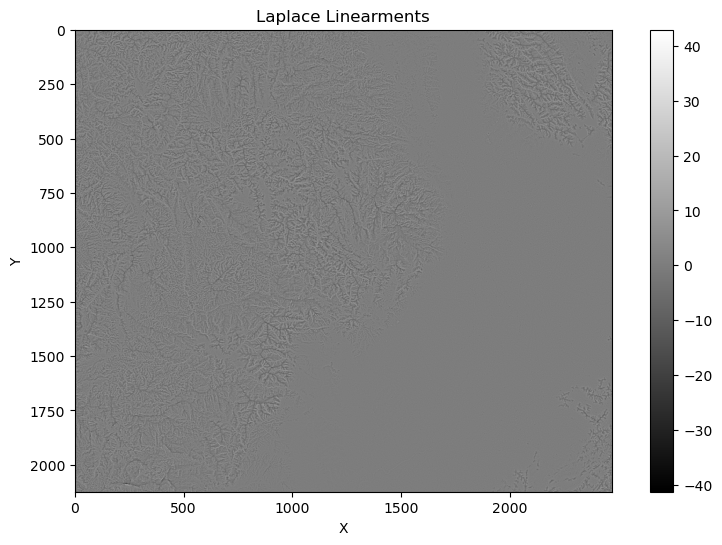

In [45]:
from scipy.ndimage import gaussian_laplace
import matplotlib.pyplot as plt

# Apply Gaussian blur followed by Laplacian
log_edges = gaussian_laplace(dem_data, sigma=1)

plt.figure(figsize=(10, 6))
plt.imshow(log_edges, cmap='gray')
plt.title('Laplace Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()

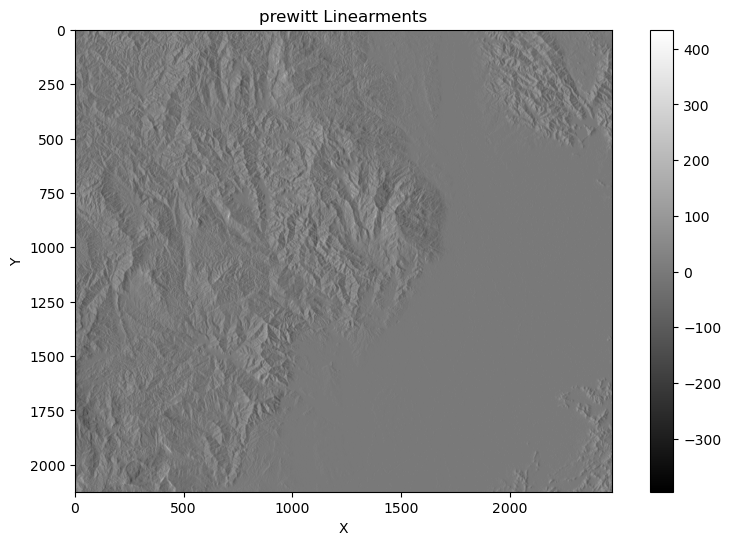

In [46]:
from scipy.ndimage import prewitt
import matplotlib.pyplot as plt

# Apply Prewitt operator
prewitt_edges = prewitt(dem_data)

plt.figure(figsize=(10, 6))
plt.imshow(prewitt_edges, cmap='gray')
plt.title('prewitt Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()

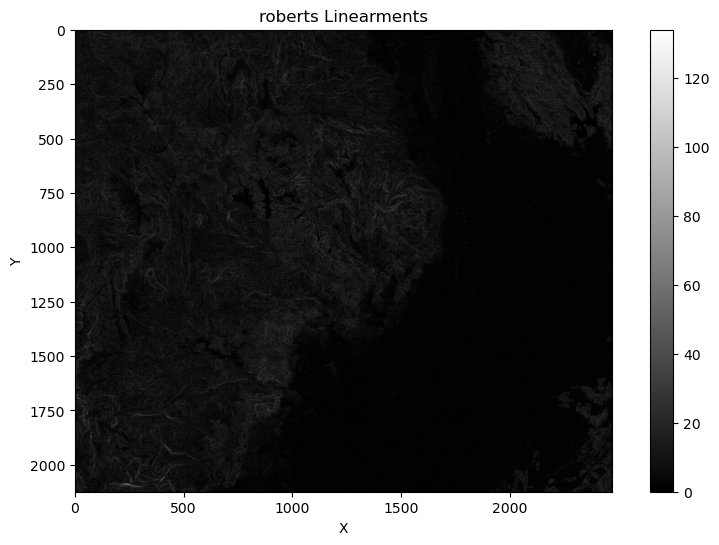

In [47]:
from skimage.filters import roberts
import matplotlib.pyplot as plt

# Assuming `dem_data` is your loaded DEM data as a 2D NumPy array
roberts_edges = roberts(dem_data)

# Displaying the result
plt.figure(figsize=(10, 6))
plt.imshow(roberts_edges, cmap='gray')
plt.title('roberts Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()



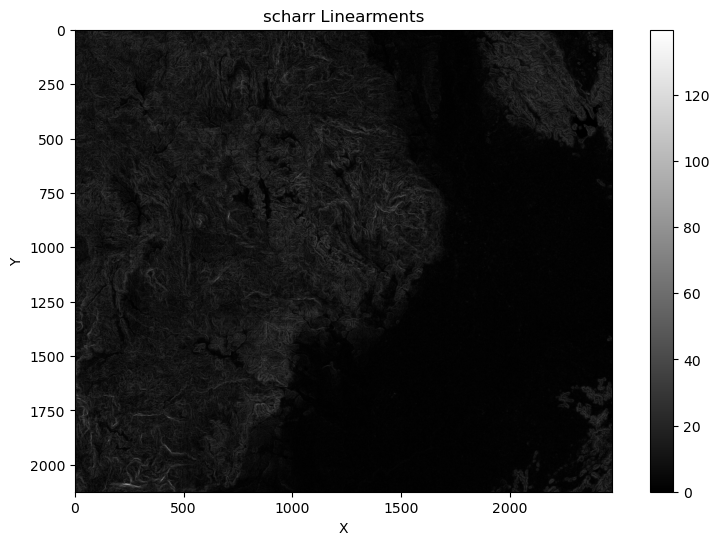

In [48]:
from skimage.filters import scharr, scharr_h, scharr_v
import matplotlib.pyplot as plt

scharr_edges = scharr(dem_data)
plt.figure(figsize=(10, 6))
plt.imshow(scharr_edges, cmap='gray')
plt.title('scharr Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()


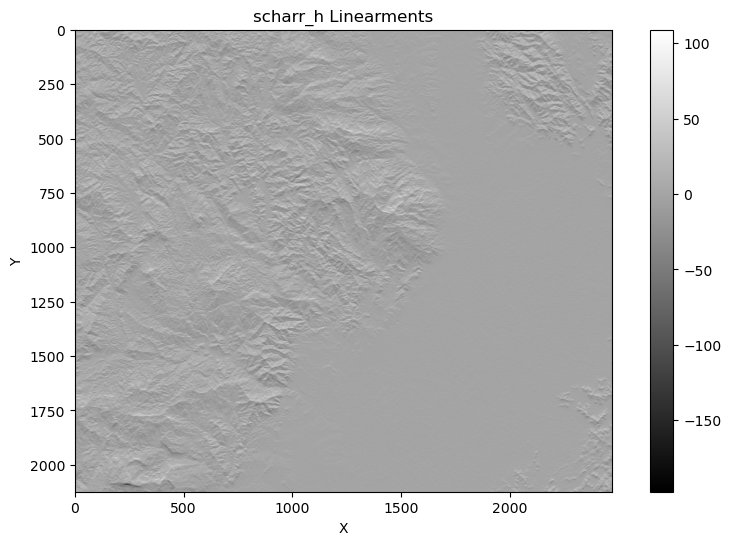

In [49]:
from skimage.filters import scharr, scharr_h, scharr_v
scharr_edges_h = scharr_h(dem_data)
plt.figure(figsize=(10, 6))
plt.imshow(scharr_edges_h, cmap='gray')
plt.title('scharr_h Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()


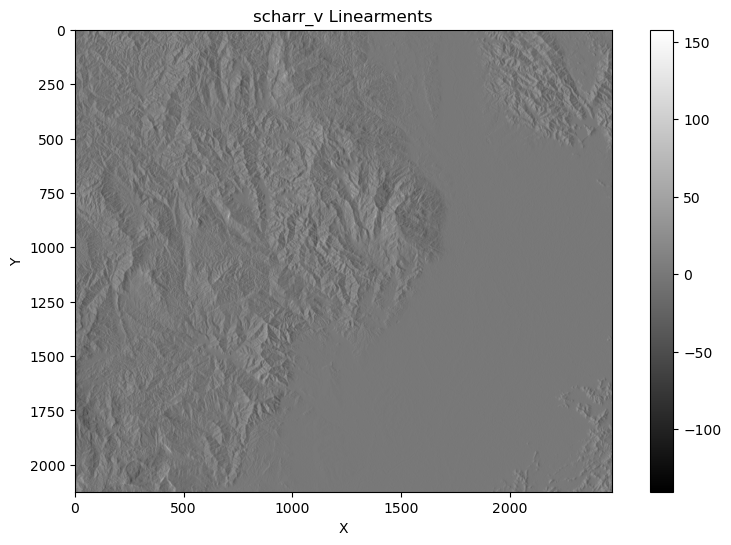

In [50]:
from skimage.filters import scharr, scharr_h, scharr_v
scharr_edges_v = scharr_v(dem_data)
plt.figure(figsize=(10, 6))
plt.imshow(scharr_edges_v, cmap='gray')
plt.title('scharr_v Linearments')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar()
plt.show()

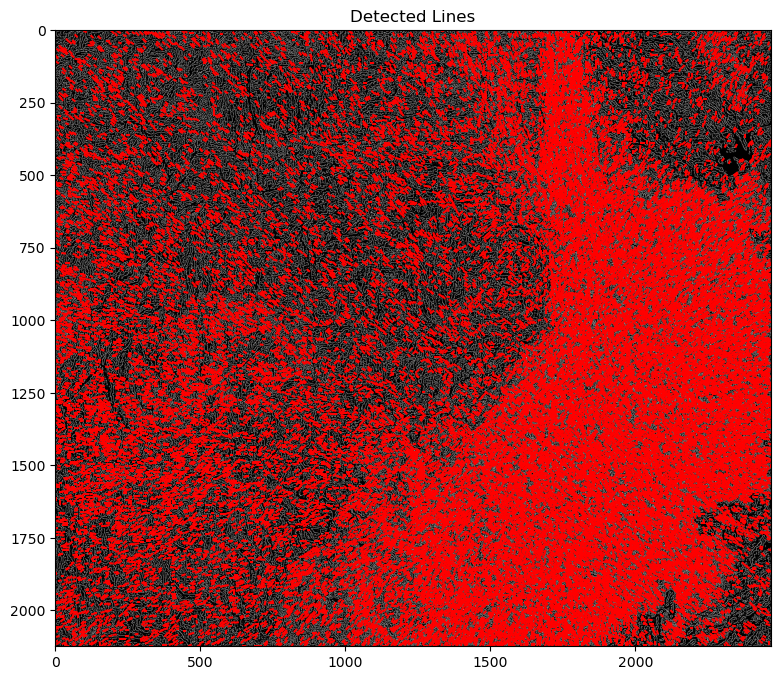

In [51]:
from skimage.feature import canny
from skimage.filters import sobel
from skimage.transform import probabilistic_hough_line
import matplotlib.pyplot as plt

edges = canny(dem_data) 
# edges = sobel(dem_data) 

# Apply the Probabilistic Hough Transform
lines = probabilistic_hough_line(edges, threshold= 1, line_length=5, line_gap=1)

# Visualizing the lines
plt.figure(figsize=(14, 8))
plt.imshow(edges, cmap='gray')  # Use 'dem_data' if you want to overlay on the original DEM
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'red')
plt.title('Detected Lines')
plt.show()


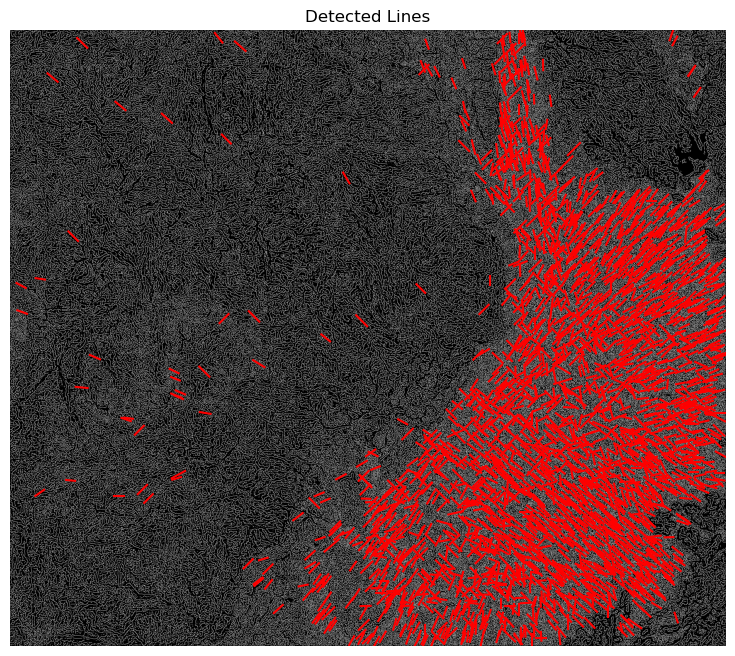

In [52]:
from skimage.morphology import skeletonize
from skimage.transform import probabilistic_hough_line
import matplotlib.pyplot as plt

edges = canny(dem_data) 
# edges = sobel(dem_data) 

skeleton = skeletonize(edges > 0)  # Convert to boolean where edges are True

# Perform Hough Transform to detect lines
lines = probabilistic_hough_line(skeleton, threshold=100, line_length=30, line_gap=3)

plt.figure(figsize=(14, 8))
plt.imshow(edges, cmap='gray')  # Use the original edge-detected image for background
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'red')
plt.title('Detected Lines')
plt.axis('off')
plt.show()


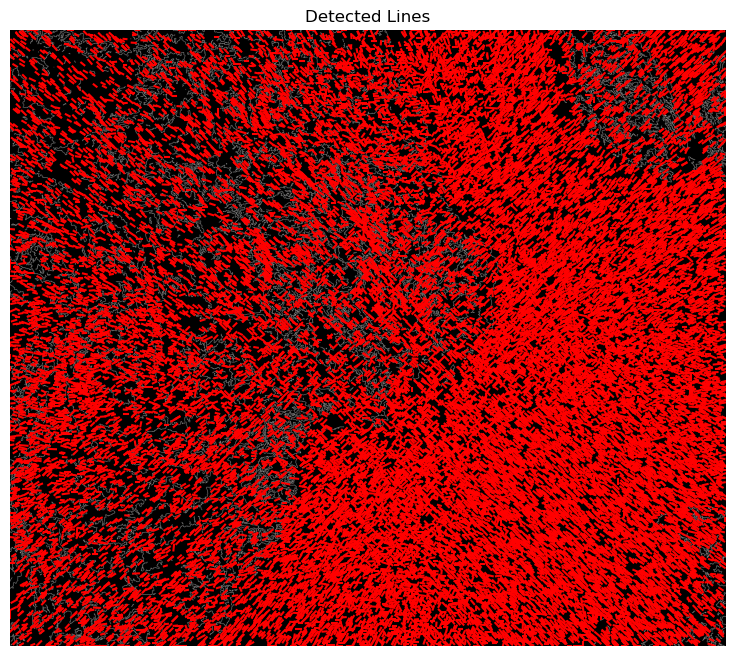

In [53]:
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_laplace
from scipy.ndimage import prewitt

# Assuming 'dem_data' is your DEM data loaded as a NumPy array
edges = cv2.Canny(dem_data.astype(np.uint8), threshold1=100, threshold2=200)
log_edges = gaussian_laplace(dem_data, sigma=1)
prewitt_edges = prewitt(dem_data)

skeleton = skeletonize(log_edges > 0) 
lines = probabilistic_hough_line(skeleton, threshold=5, line_length=10, line_gap=3)

plt.figure(figsize=(14, 8))
plt.imshow(edges, cmap='gray')  
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'red')
plt.title('Detected Lines')
plt.axis('off')
plt.show()

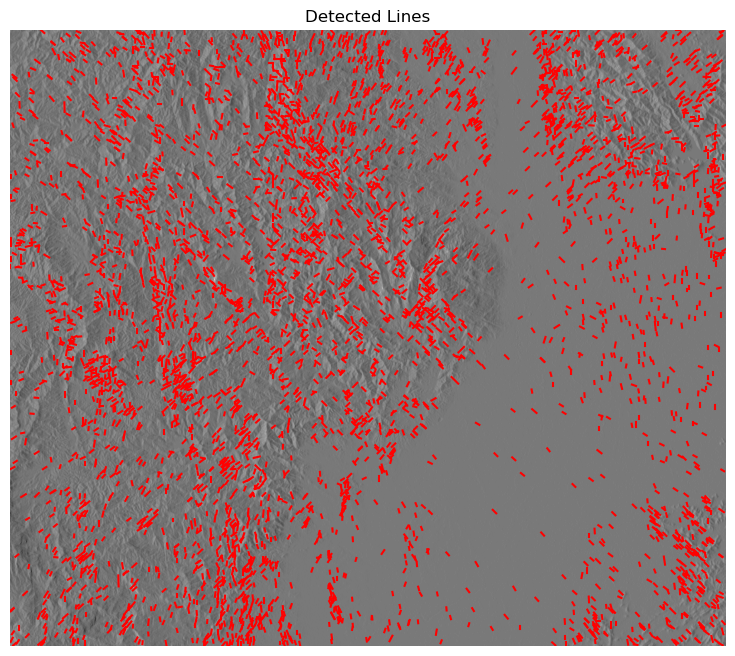

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_laplace
from scipy.ndimage import prewitt

# Apply Gaussian Blur
blurred_image = cv2.GaussianBlur(dem_data, (5, 5), 0)  # Kernel size (5,5), SigmaX = 0


edges = cv2.Canny(blurred_image.astype(np.uint8), threshold1=100, threshold2=200)
log_edges = gaussian_laplace(dem_data, sigma=1)
prewitt_edges = prewitt(dem_data)

skeleton = skeletonize(prewitt_edges > 5) 
lines = probabilistic_hough_line(skeleton, threshold=1, line_length=10, line_gap=3)

plt.figure(figsize=(14, 8))
plt.imshow(prewitt_edges, cmap='gray')  
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'red')
plt.title('Detected Lines')
plt.axis('off')
plt.show()


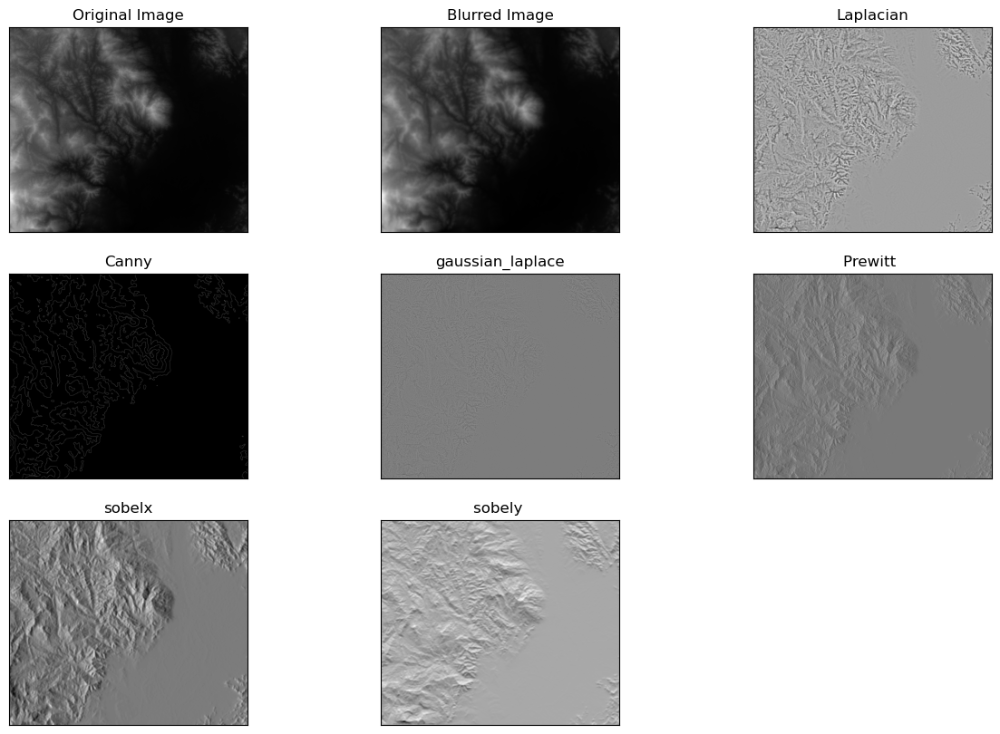

In [55]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_laplace
from scipy.ndimage import prewitt


blurred_image = cv2.GaussianBlur(dem_data, (31, 31), 0)  # Kernel size (5,5), SigmaX = 0

# blurred_image = cv2.medianBlur(dem_data, 31)

laplacian_filtered_image = cv2.Laplacian(blurred_image, cv2.CV_64F)
edges = cv2.Canny(blurred_image.astype(np.uint8), threshold1=100, threshold2=200)
log_edges = gaussian_laplace(dem_data, sigma=1)
prewitt_edges = prewitt(dem_data)
sobelx = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=5)


plt.figure(figsize=(15, 10))  # Adjusted for better display of two rows

# First row
plt.subplot(331), plt.imshow(dem_data, cmap='gray'), plt.title('Original Image')
plt.xticks([]), plt.yticks([])

plt.subplot(332), plt.imshow(blurred_image, cmap='gray'), plt.title('Blurred Image')
plt.xticks([]), plt.yticks([])

plt.subplot(333), plt.imshow(laplacian_filtered_image, cmap='gray'), plt.title('Laplacian')
plt.xticks([]), plt.yticks([])

# Second row
plt.subplot(334), plt.imshow(edges, cmap='gray'), plt.title('Canny')
plt.xticks([]), plt.yticks([])

plt.subplot(335), plt.imshow(log_edges, cmap='gray'), plt.title('gaussian_laplace')
plt.xticks([]), plt.yticks([])

plt.subplot(336), plt.imshow(prewitt_edges, cmap='gray'), plt.title('Prewitt ')
plt.xticks([]), plt.yticks([])

plt.subplot(337), plt.imshow(sobelx, cmap='gray'), plt.title('sobelx')
plt.xticks([]), plt.yticks([])

plt.subplot(338), plt.imshow(sobely, cmap='gray'), plt.title('sobely ')
plt.xticks([]), plt.yticks([])


plt.show()


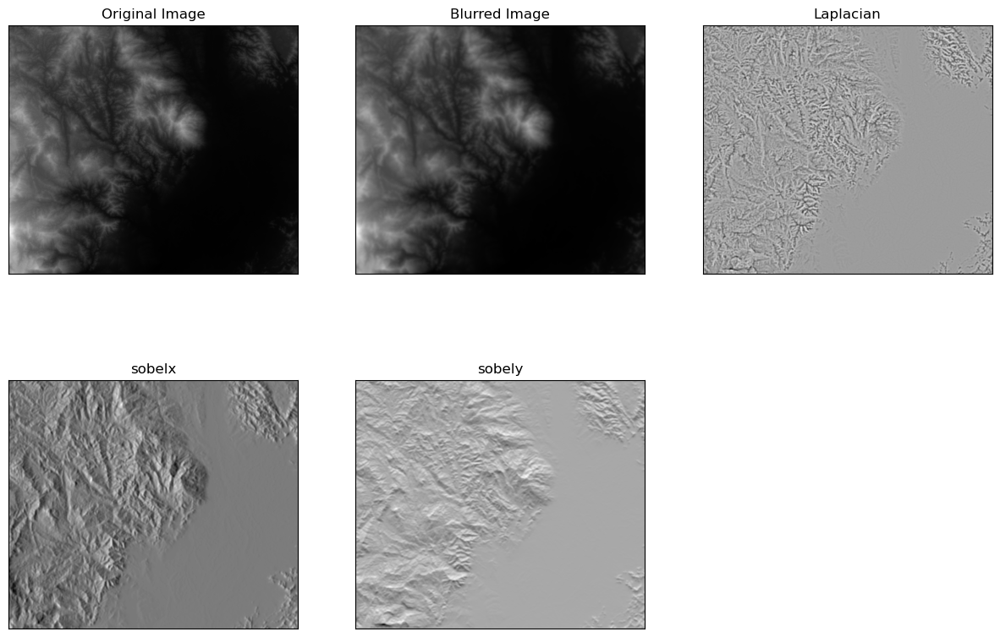

In [56]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_laplace
from scipy.ndimage import prewitt


blurred_image = cv2.GaussianBlur(dem_data, (31, 31), 0)  # Kernel size (5,5), SigmaX = 0

laplacian_filtered_image = cv2.Laplacian(blurred_image, cv2.CV_64F)
#  four directional Laplacian filter
laplacian_filtered_image = cv2.Laplacian(blurred_image, cv2.CV_64F, ksize=5)


plt.figure(figsize=(15, 10))  # Adjusted for better display of two rows

# First row
plt.subplot(231), plt.imshow(dem_data, cmap='gray'), plt.title('Original Image')
plt.xticks([]), plt.yticks([])

plt.subplot(232), plt.imshow(blurred_image, cmap='gray'), plt.title('Blurred Image')
plt.xticks([]), plt.yticks([])

plt.subplot(233), plt.imshow(laplacian_filtered_image, cmap='gray'), plt.title('Laplacian')
plt.xticks([]), plt.yticks([])

# Second row
plt.subplot(234), plt.imshow(sobelx, cmap='gray'), plt.title('sobelx')
plt.xticks([]), plt.yticks([])

plt.subplot(235), plt.imshow(sobely, cmap='gray'), plt.title('sobely')
plt.xticks([]), plt.yticks([])

plt.show()


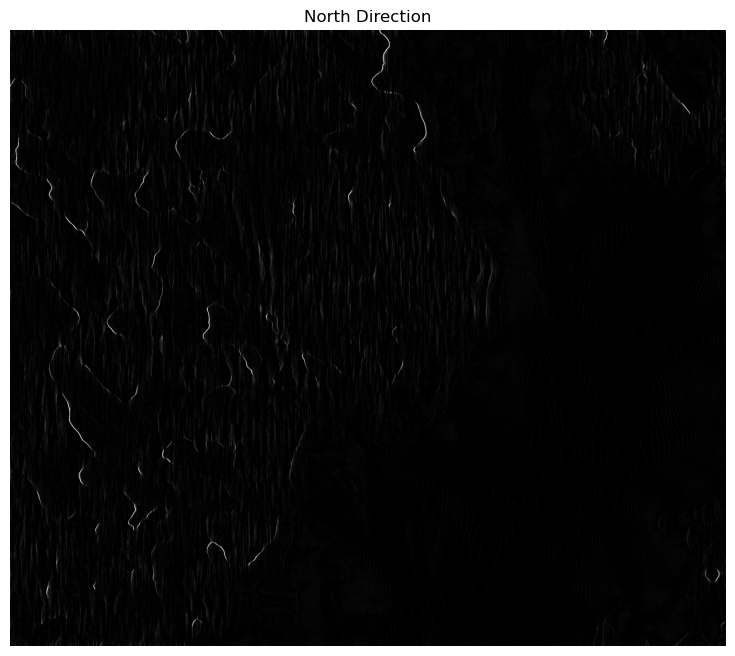

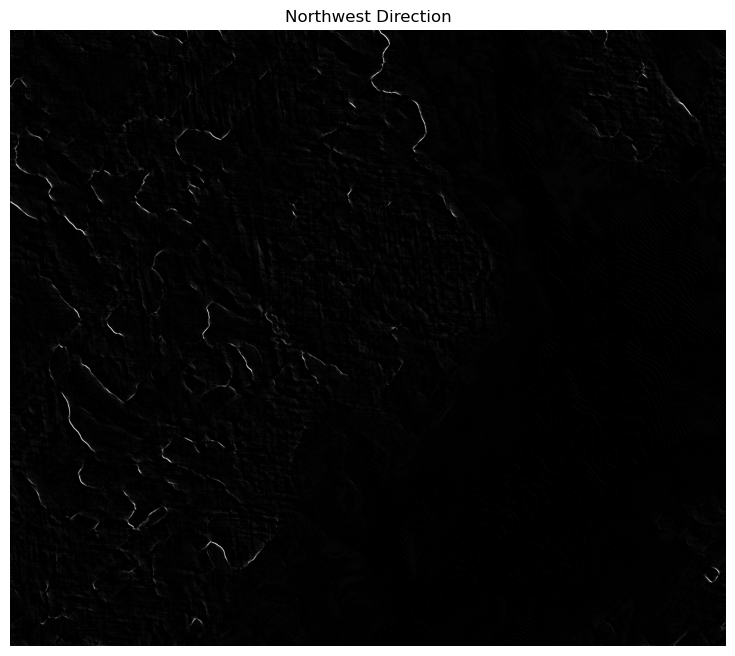

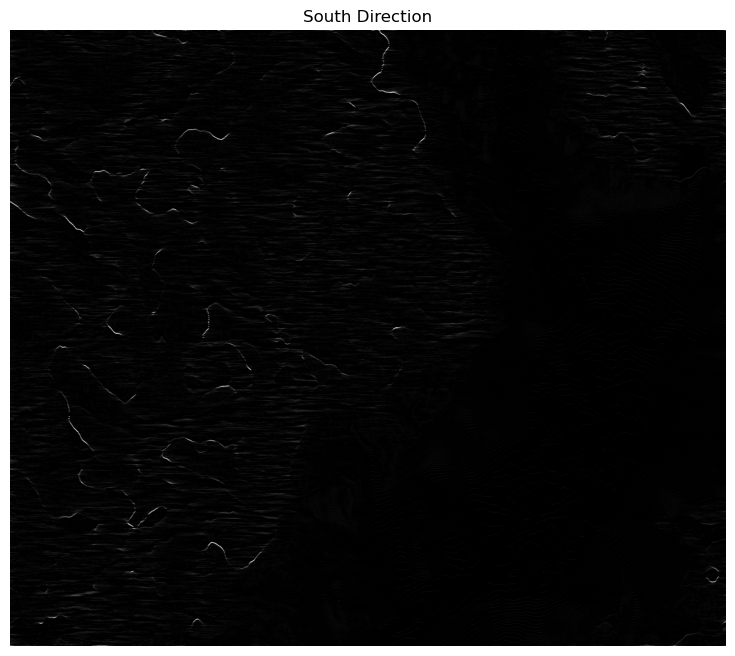

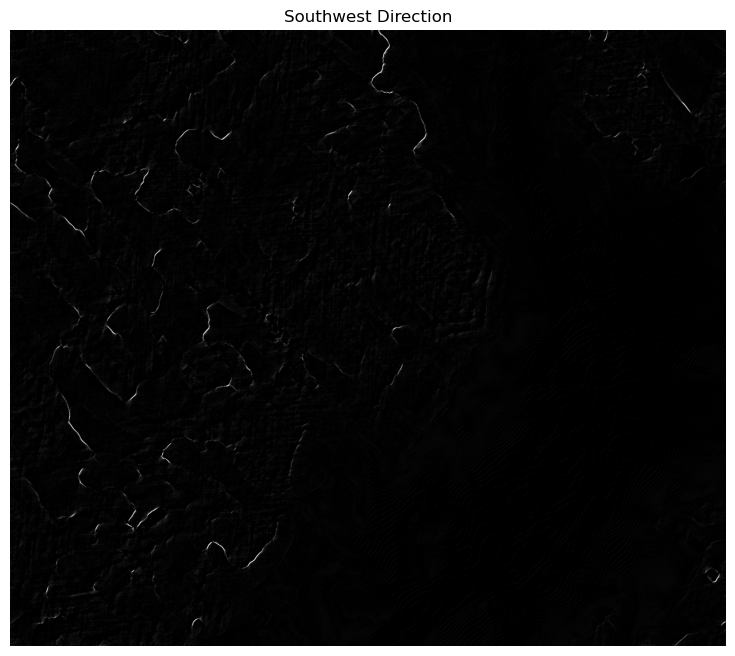

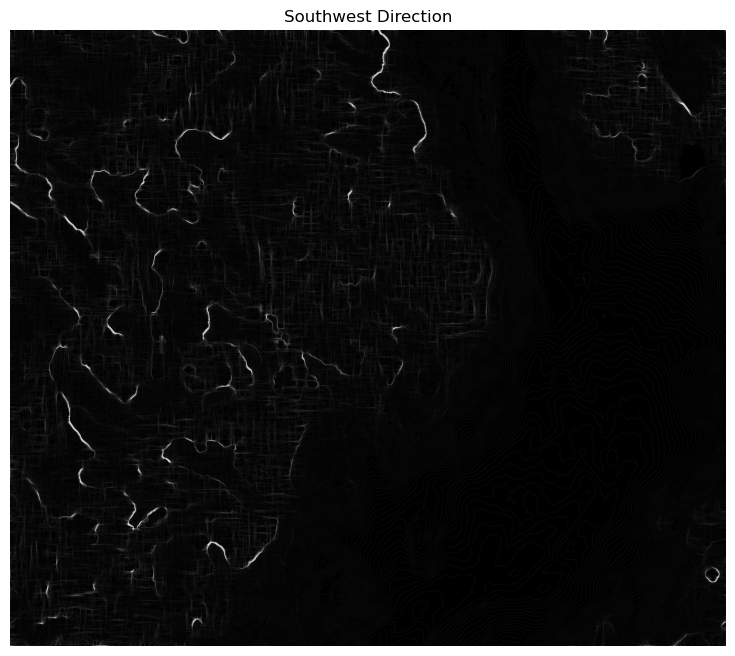

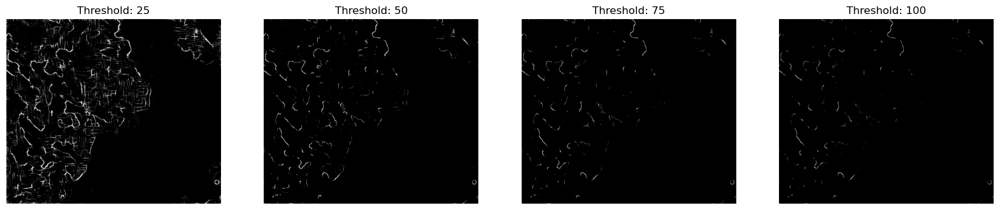

In [57]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image
image = dem_data

k = 65

# Apply Gaussian Blur
# blurred_image = cv2.GaussianBlur(dem_data, (k, k), 0)

if image.dtype != np.uint8:
    image = image.astype(np.uint8)

blurred_image = cv2.medianBlur(image, k)

# Custom kernels 5 * 5 for directional edges
kernel_N = np.array([[-1, -1, 4, -1, -1],
                        [-2, -2, 8, -2, -2],
                        [-3, -3, 12, -3, -3],
                        [-2, -2, 8, -2, -2],
                        [-1, -1, 4, -1, -1]])

kernel_NW = np.array([[4, -1, -1, -2, -3],
                        [-1, 8, -2, -3, -2],
                        [-1, -2, 12, -2, -1],
                        [-2, -3, -2, 8, -1],
                        [-3, -2, -1, -1, 4]])

kernel_S = np.array([[-1, -2, -3, -2, -1],
                        [-1, -2, -3, -2, -1],
                        [4, 8, 12, 8, 4],
                        [-1, -2, -3, -2, -1],
                        [-1, -2, -3, -2, -1]])

kernel_SW = np.array([[-3, -2, -1, -1, 4],
                        [-2, -3, -2, 8, -1],
                        [-1, -2, 12, -2, -1],
                        [-1, 8, -2, -3, -2],
                        [4, -1, -1, -2, -3]])

# Apply kernels
edges_N = cv2.filter2D(blurred_image, -1, kernel_N)
edges_NW = cv2.filter2D(blurred_image, -1, kernel_NW)
edges_S = cv2.filter2D(blurred_image, -1, kernel_S)
edges_SW = cv2.filter2D(blurred_image, -1, kernel_SW)


# Combine the images by taking the maximum value at each pixel
all_edges = np.stack([edges_N, edges_NW, edges_S, edges_SW])
omni_directional_edges = np.maximum.reduce(all_edges)

# Display the results
plt.figure(figsize=(14, 8))
plt.imshow(edges_N, cmap='gray')  
plt.title('North Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_NW, cmap='gray')  
plt.title('Northwest Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_S, cmap='gray')  
plt.title('South Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_SW, cmap='gray')  
plt.title('Southwest Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(omni_directional_edges, cmap='gray')  
plt.title('Southwest Direction')
plt.axis('off')
plt.show()


def extract_lineaments(edge_map, threshold):
    _, lineaments = cv2.threshold(edge_map, threshold, 255, cv2.THRESH_BINARY)
    return lineaments

# Vary the threshold as needed
threshold_values = [25, 50, 75, 100]  # Example threshold values
fig, axs = plt.subplots(1, len(threshold_values), figsize=(20, 5))

for i, threshold in enumerate(threshold_values):
    lineaments = extract_lineaments(omni_directional_edges, threshold)
    axs[i].imshow(lineaments, cmap='gray')
    axs[i].set_title(f'Threshold: {threshold}')
    axs[i].axis('off')

plt.show()


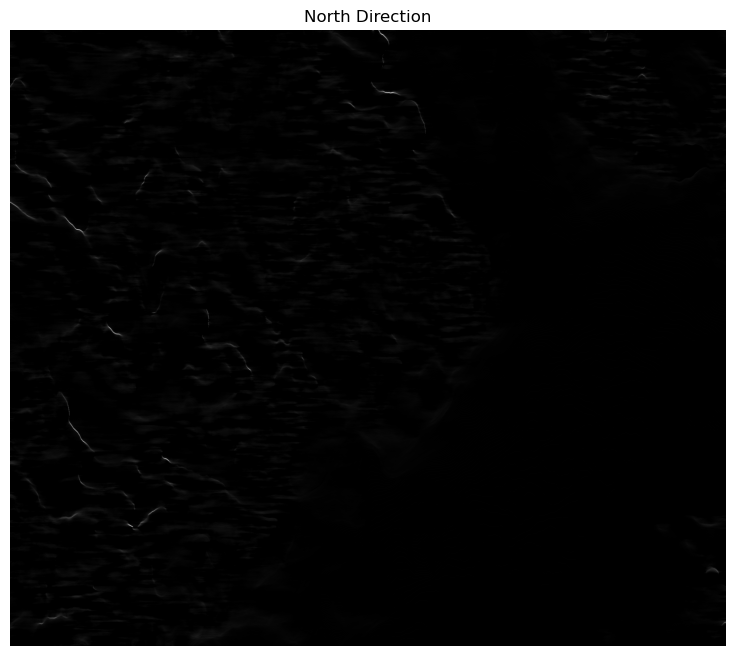

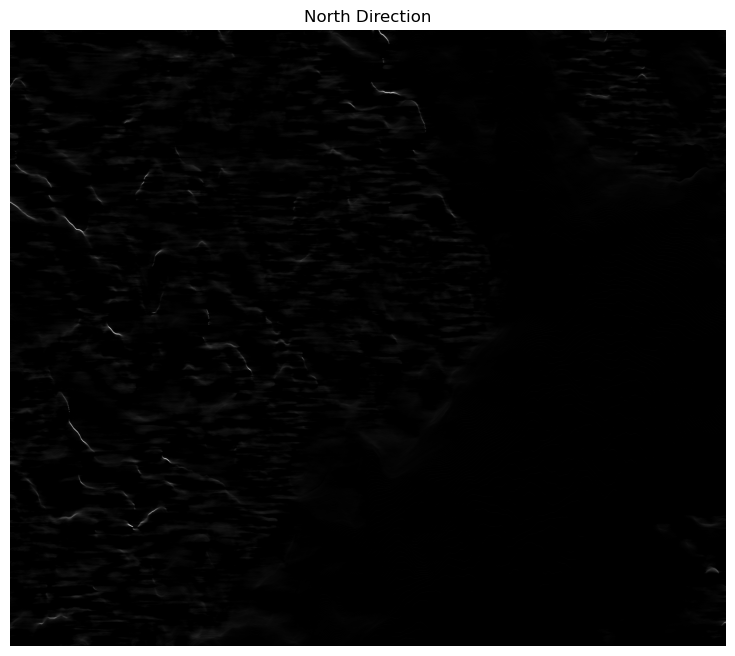

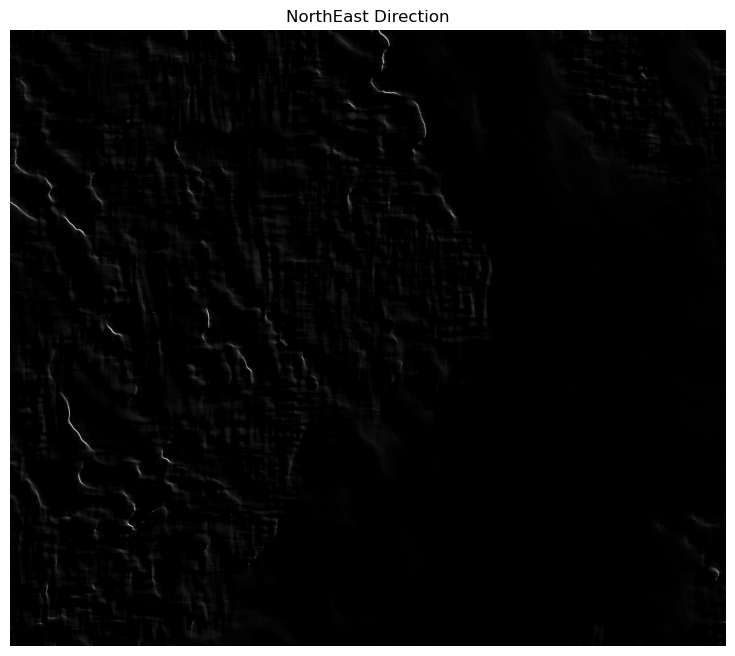

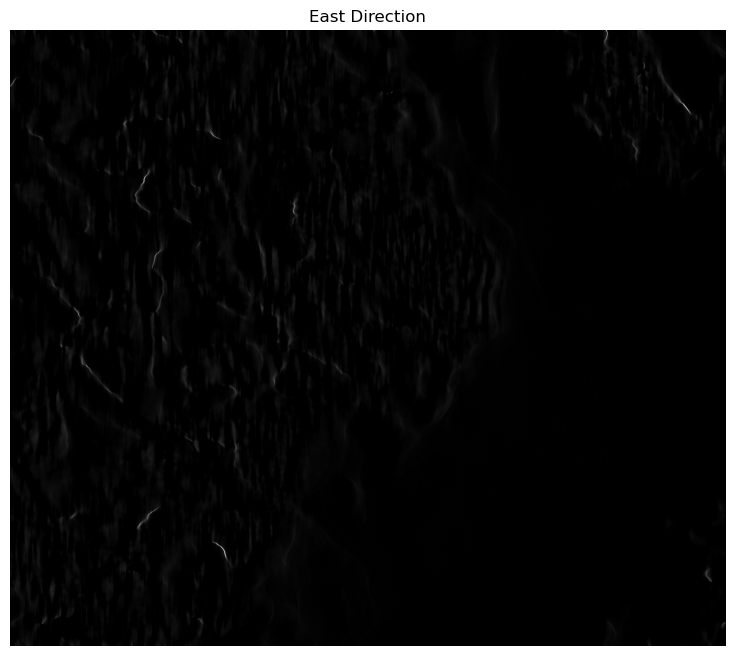

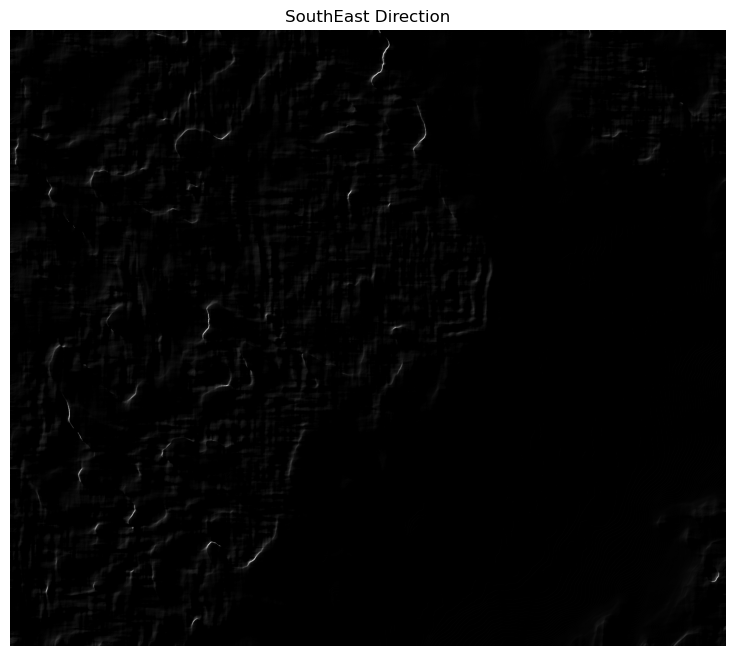

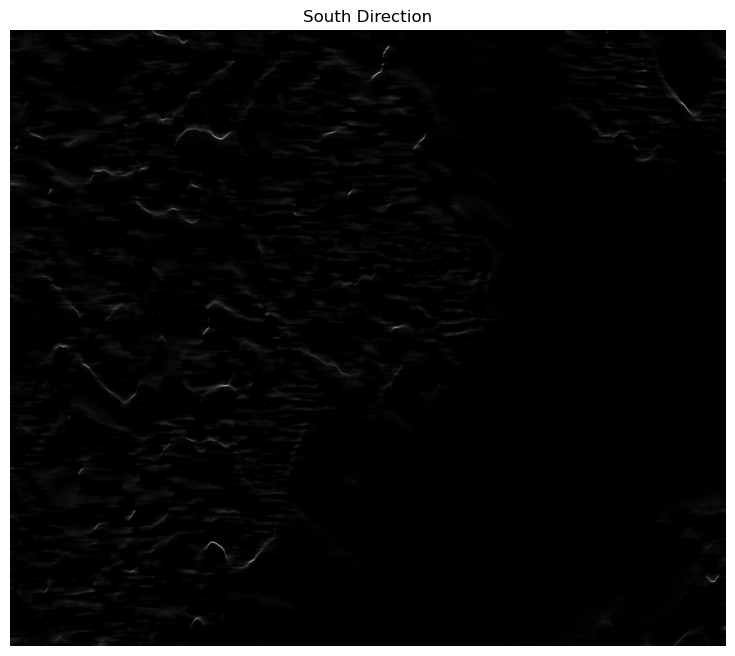

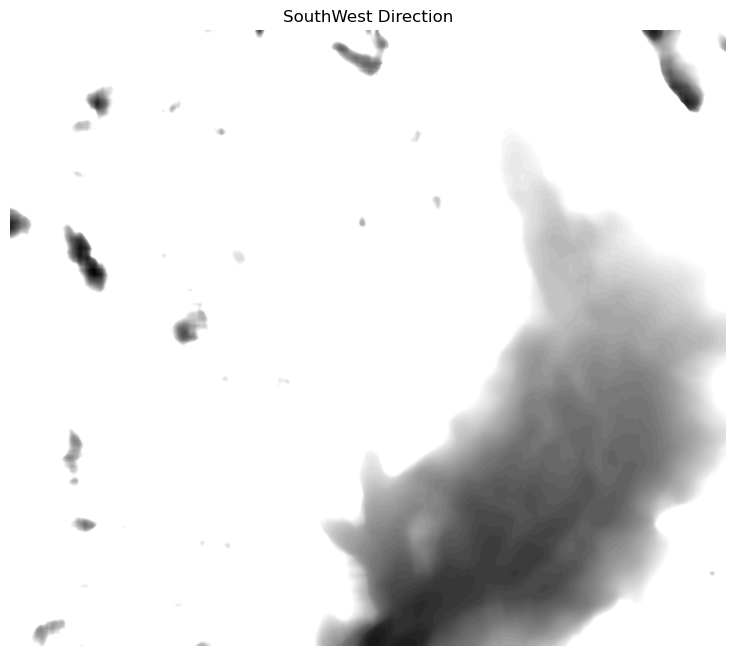

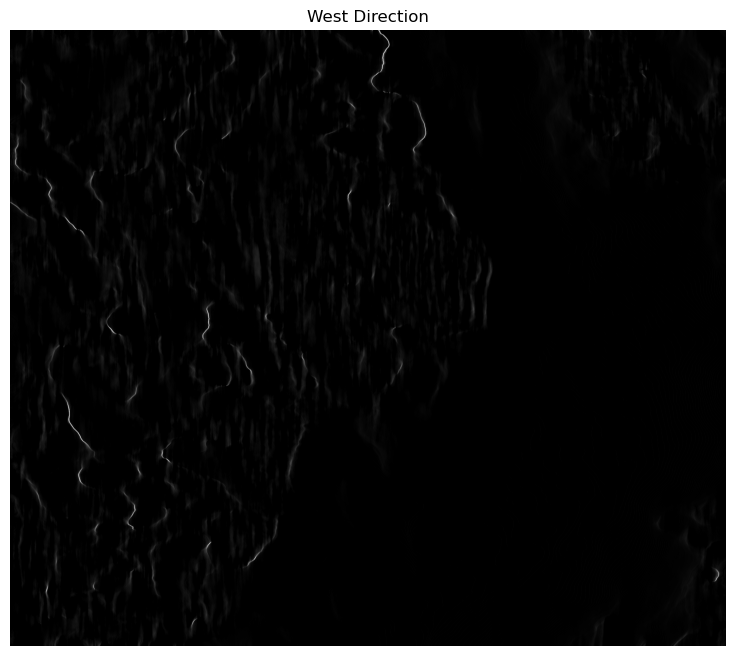

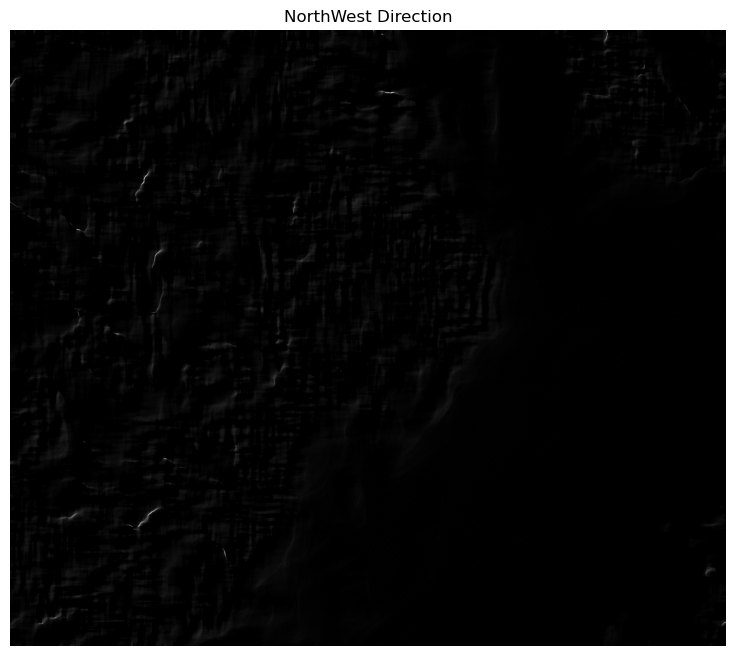

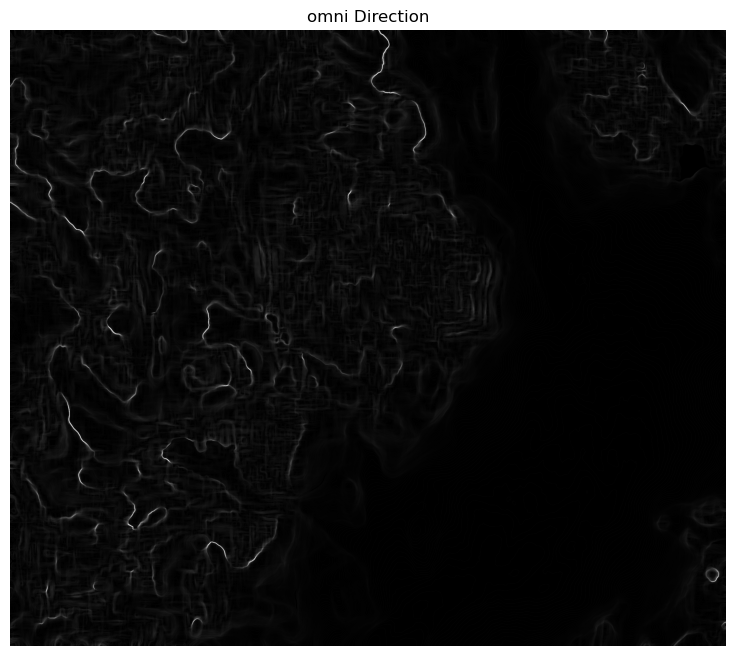

In [58]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image
image = dem_data

k = 65

# Apply Gaussian Blur
# blurred_image = cv2.GaussianBlur(dem_data, (k, k), 0)

if image.dtype != np.uint8:
    image = image.astype(np.uint8)

blurred_image = cv2.medianBlur(image, k)

kernel3 = np.array([[1, 1, 1],
                     [1, -2, 1],
                     [-1, -1, -1]])

edges_k3 = cv2.filter2D(blurred_image, -1, kernel3)

plt.figure(figsize=(14, 8))
plt.imshow(edges_k3, cmap='gray')  
plt.title('North Direction')
plt.axis('off')
plt.show()

# Gradient East
gradient_E = np.array([[1, 0, -1],
                        [2, 0, -2],
                        [1, 0, -1]])
# Gradient South
gradient_S = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]])
# Gradient West
gradient_W = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])
# Gradient North
gradient_N = np.array([[1, 2, 1],
                        [0, 0, 0],
                        [-1, -2, -1]])
# Gradient North-East
gradient_NE = np.array([[0, 1, 2],
                        [-1, 0, 1],
                        [-2, -1, 0]])
# Gradient South-East
gradient_SE = np.array([[-2, -1, 0],
                        [-1, 0, 1],
                        [0, 1, 2]])
# Gradient South-West
gradient_SW = np.array([[0, 1, 2],
                        [1, 0, -1],
                        [2, -1, 0]])
# Gradient North-West
gradient_NW = np.array([[2, 1, 0],
                        [1, 0, -1],
                        [0, -1, -2]])

# Apply the gradients
edges_N = cv2.filter2D(blurred_image, -1, gradient_N)
edges_NE = cv2.filter2D(blurred_image, -1, gradient_NE)
edges_E = cv2.filter2D(blurred_image, -1, gradient_E)
edges_SE = cv2.filter2D(blurred_image, -1, gradient_SE)
edges_S = cv2.filter2D(blurred_image, -1, gradient_S)
edges_SW = cv2.filter2D(blurred_image, -1, gradient_SW)
edges_W = cv2.filter2D(blurred_image, -1, gradient_W)
edges_NW = cv2.filter2D(blurred_image, -1, gradient_NW)

# Combine the images by taking the maximum value at each pixel
all_edges = np.stack([edges_N, edges_NE, edges_E, edges_SE,edges_S, edges_W,edges_NW])
omni_directional_edges = np.maximum.reduce(all_edges)

# Display the results
plt.figure(figsize=(14, 8))
plt.imshow(edges_N, cmap='gray')  
plt.title('North Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_NE, cmap='gray')
plt.title('NorthEast Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_E, cmap='gray')
plt.title('East Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_SE, cmap='gray')
plt.title('SouthEast Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_S, cmap='gray')
plt.title('South Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_SW, cmap='gray')
plt.title('SouthWest Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_W, cmap='gray')
plt.title('West Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_NW, cmap='gray')
plt.title('NorthWest Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(omni_directional_edges, cmap='gray')
plt.title('omni Direction')
plt.axis('off')
plt.show()


# def extract_lineaments(edge_map, threshold):
#     _, lineaments = cv2.threshold(edge_map, threshold, 255, cv2.THRESH_BINARY)
#     return lineaments

# threshold_values = [25, 50, 75, 100] 
# fig, axs = plt.subplots(1, len(threshold_values), figsize=(20, 5))

# for i, threshold in enumerate(threshold_values):
#     lineaments = extract_lineaments(omni_directional_edges, threshold)
#     axs[i].imshow(lineaments, cmap='gray')
#     axs[i].set_title(f'Threshold: {threshold}')
#     axs[i].axis('off')

# plt.show()


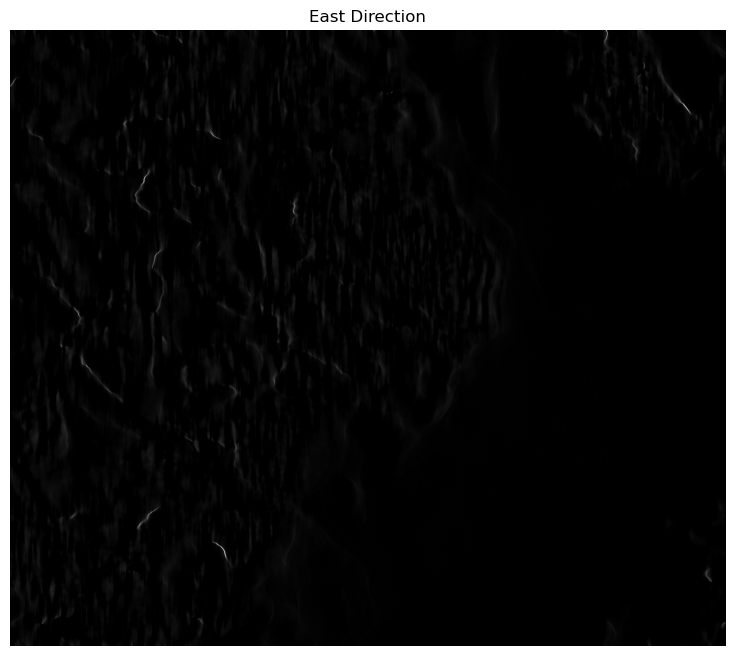

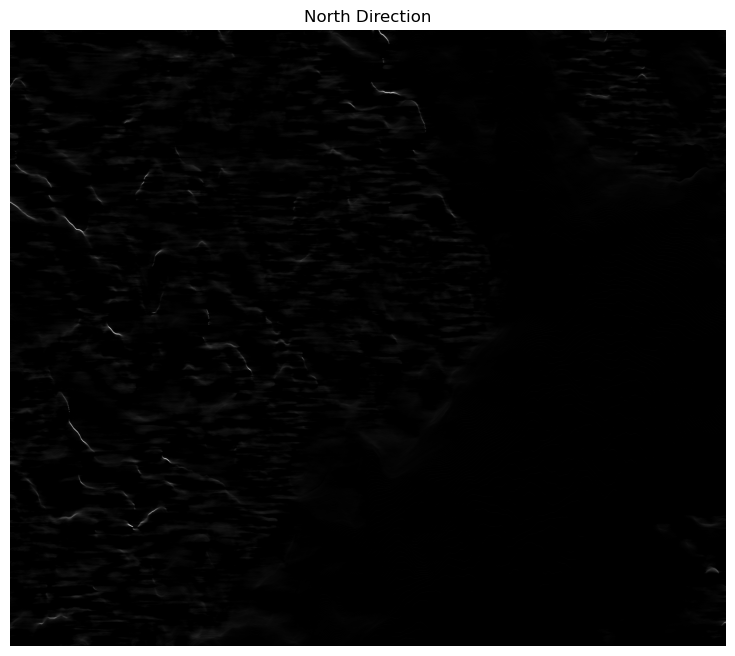

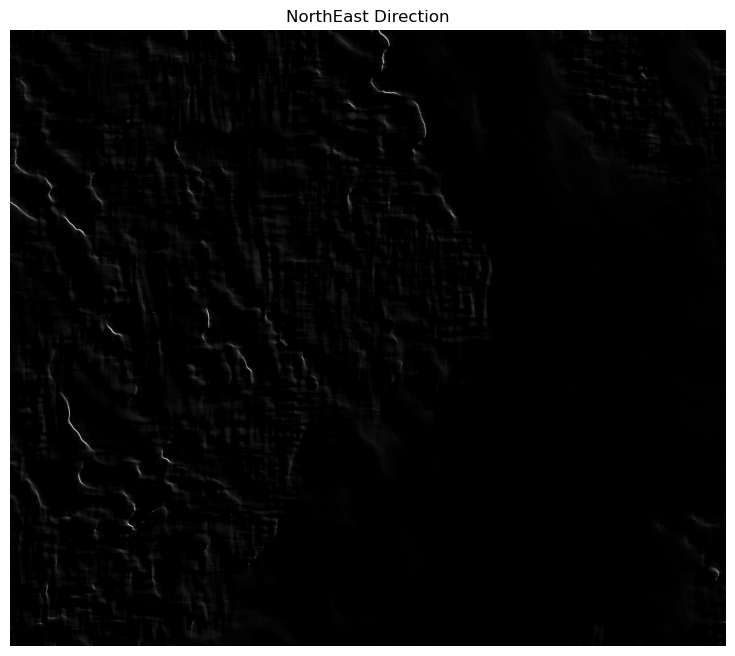

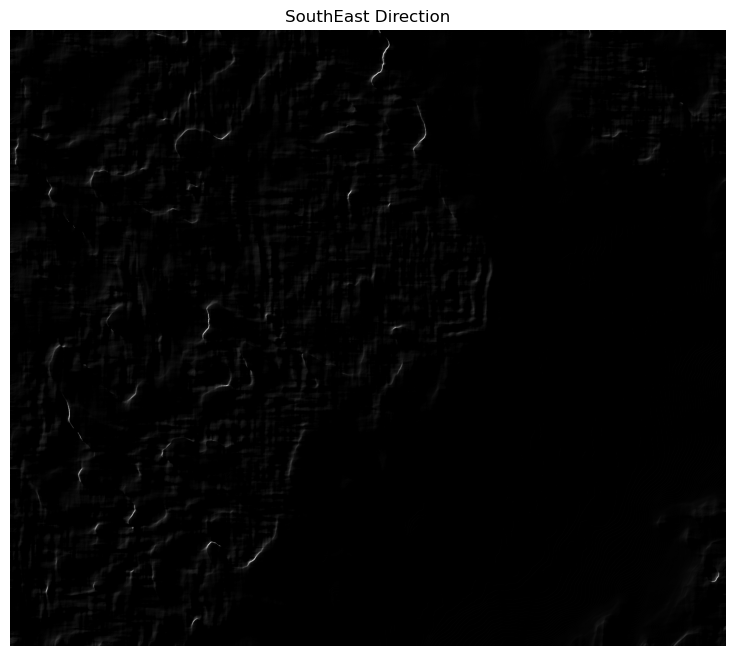

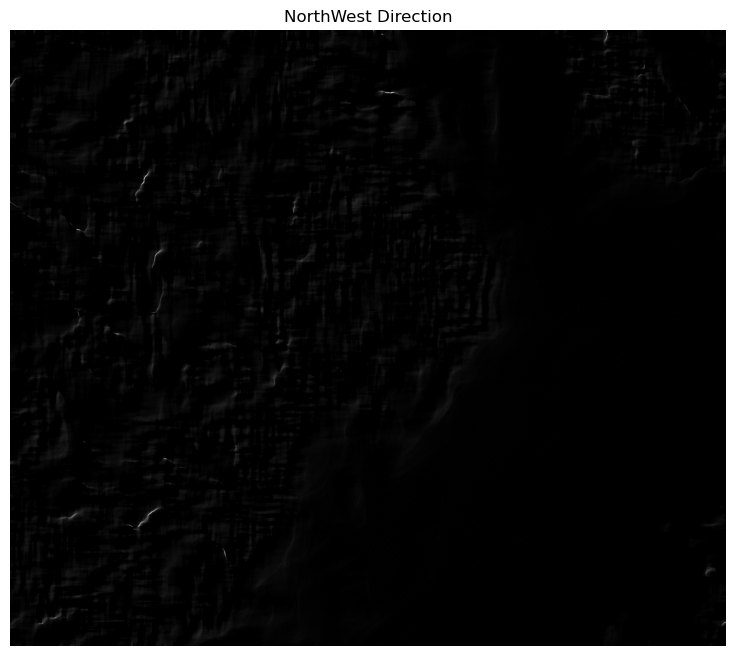

...

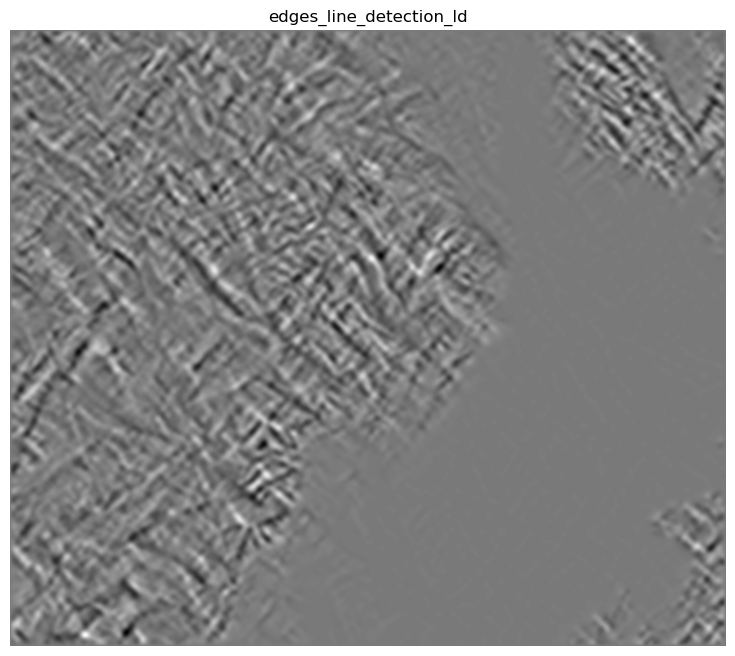

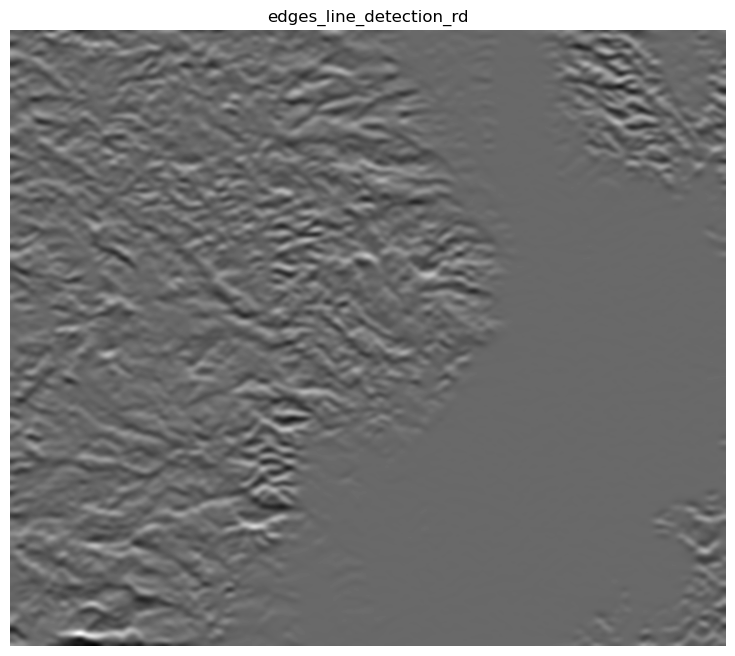

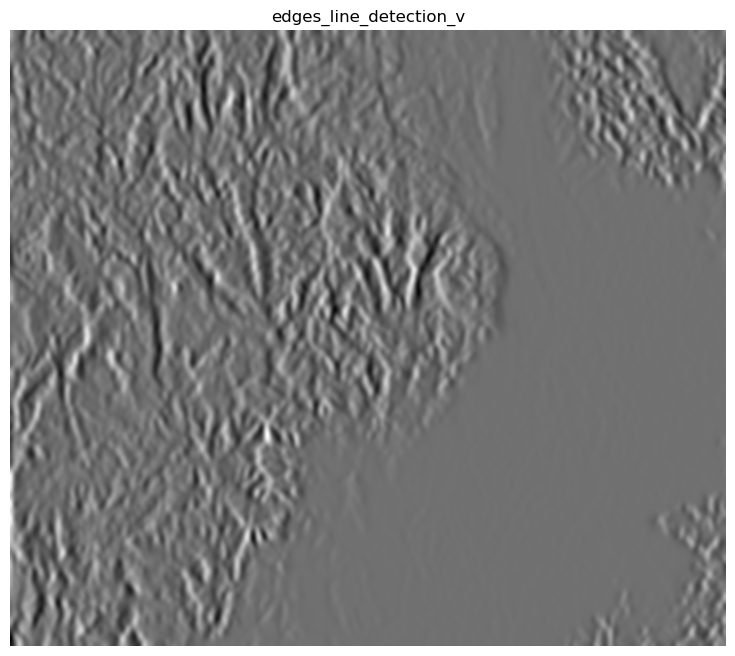

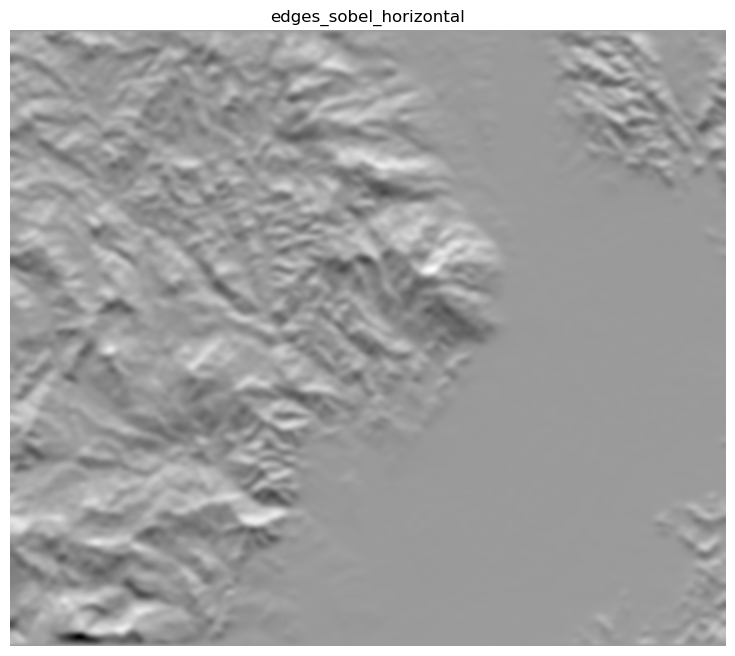

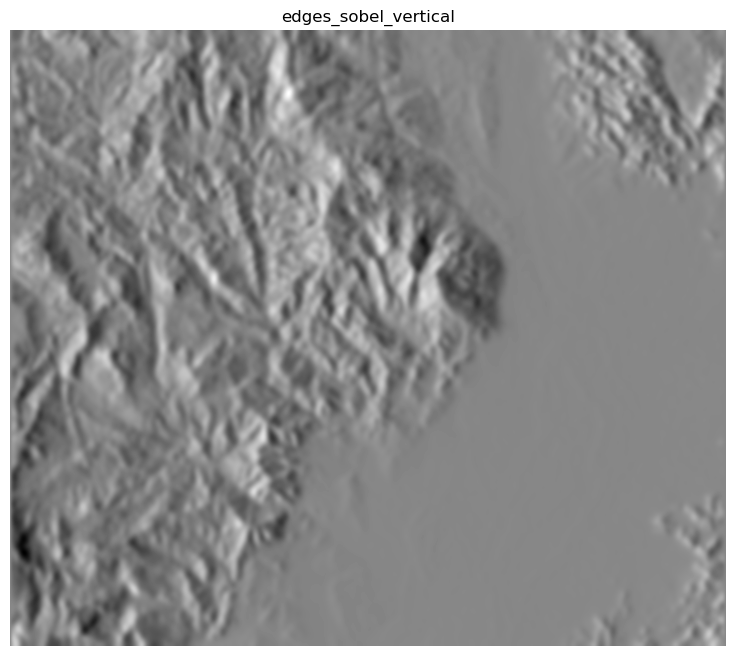

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image
image = dem_data

k = 65

# Apply Gaussian Blur
blurred_image = cv2.GaussianBlur(dem_data, (k, k), 0)

if image.dtype != np.uint8:
    image = image.astype(np.uint8)

# blurred_image = cv2.medianBlur(image, k)

# gradient from ArcGIS
gradient_E = np.array([[1, 0, -1],
                       [2, 0, -2],
                       [1, 0, -1]])

gradient_N = np.array([[-1, -2, -1],
                       [0,  0,  0],
                       [1,  2,  1]])

gradient_NE = np.array([[0, -1, -2],
                        [1,  0, -1],
                        [2,  1,  0]])

gradient_SE = np.array([[-2, -1, 0],
                        [-1,  0, 1],
                        [0,  1, 2]])

gradient_NW = np.array([[-2, -1, 0],
                        [-1,  0, 1],
                        [0,  1,  2]])

gradient_S = np.array([[1,  2,  1],
                       [0,  0,  0],
                       [-1, -2, -1]])

gradient_W = np.array([[-1,  0,  1],
                       [-2,  0,  2],
                       [-1,  0,  1]])


# Combine the images by taking the maximum value at each pixel
all_edges = np.stack([edges_E, edges_N, edges_NE, edges_SE, edges_NW, edges_S, edges_W])
omni_directional_edges = np.maximum.reduce(all_edges)

# Display the results
plt.figure(figsize=(14, 8))
plt.imshow(edges_E, cmap='gray')
plt.title('East Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_N, cmap='gray')  
plt.title('North Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_NE, cmap='gray')
plt.title('NorthEast Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_SE, cmap='gray')
plt.title('SouthEast Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_NW, cmap='gray')
plt.title('NorthWest Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_S, cmap='gray')
plt.title('South Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_W, cmap='gray')
plt.title('West Direction')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(omni_directional_edges, cmap='gray')
plt.title('omni Direction')
plt.axis('off')
plt.show()

# Apply the gradients
edges_E = cv2.filter2D(blurred_image, -1, gradient_E)
edges_N = cv2.filter2D(blurred_image, -1, gradient_N)
edges_NE = cv2.filter2D(blurred_image, -1, gradient_NE)
edges_SE = cv2.filter2D(blurred_image, -1, gradient_SE)
edges_NW = cv2.filter2D(blurred_image, -1, gradient_NW)
edges_S = cv2.filter2D(blurred_image, -1, gradient_S)
edges_W = cv2.filter2D(blurred_image, -1, gradient_W)

# Laplacian 3x3
laplacian3 = np.array([[0, -1, 0],
                       [-1, 4, -1],
                       [0, -1, 0]])

# Laplacian 5x5
laplacian5 = np.array([[0, 0, -1, 0, 0],
                       [0, -1, -2, -1, 0],
                       [-1, -2, 17, -2, -1],
                       [0, -1, -2, -1, 0],
                       [0, 0, -1, 0, 0]])

# Line Detection Horizontal
line_detection_h = np.array([[-1, -1, -1],
                             [2, 2, 2],
                             [-1, -1, -1]])

# Line Detection Left Diagonal
line_detection_ld = np.array([[2, -1, -1],
                              [-1, 2, -1],
                              [-1, -1, 2]])

# Line Detection Right Diagonal
line_detection_rd = np.array([[-1, -1, -1],
                              [2, 2, 2],
                              [-1, -1, -1]])

# Line Detection Vertical
line_detection_v = np.array([[-1, 2, -1],
                             [-1, 2, -1],
                             [-1, 2, -1]])
 
# apply the kernels
edges_laplacian3 = cv2.filter2D(blurred_image, -1, laplacian3)
edges_laplacian5 = cv2.filter2D(blurred_image, -1, laplacian5)
edges_line_detection_h = cv2.filter2D(blurred_image, -1, line_detection_h)
edges_line_detection_ld = cv2.filter2D(blurred_image, -1, line_detection_ld)
edges_line_detection_rd = cv2.filter2D(blurred_image, -1, line_detection_rd)
edges_line_detection_v = cv2.filter2D(blurred_image, -1, line_detection_v)

plt.figure(figsize=(14, 8))
plt.imshow(edges_laplacian3, cmap='gray')
plt.title('edges_laplacian3')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_laplacian5, cmap='gray')
plt.title('edges_laplacian5')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_line_detection_h, cmap='gray')
plt.title('edges_line_detection_h')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_line_detection_ld, cmap='gray')
plt.title('edges_line_detection_ld')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_line_detection_rd, cmap='gray')
plt.title('edges_line_detection_rd')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_line_detection_v, cmap='gray')
plt.title('edges_line_detection_v')
plt.axis('off')
plt.show()

# Sobel Horizontal
sobel_horizontal = np.array([[-1, -2, -1],
                             [0, 0, 0],
                             [1, 2, 1]])

# Sobel Vertical
sobel_vertical = np.array([[-1, 0, 1],
                           [-2, 0, 2],
                           [-1, 0, 1]])

# Apply the Sobel kernels
edges_sobel_horizontal = cv2.filter2D(blurred_image, -1, sobel_horizontal)
edges_sobel_vertical = cv2.filter2D(blurred_image, -1, sobel_vertical)

plt.figure(figsize=(14, 8))
plt.imshow(edges_sobel_horizontal, cmap='gray')
plt.title('edges_sobel_horizontal')
plt.axis('off')
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(edges_sobel_vertical, cmap='gray')
plt.title('edges_sobel_vertical')
plt.axis('off')
plt.show()



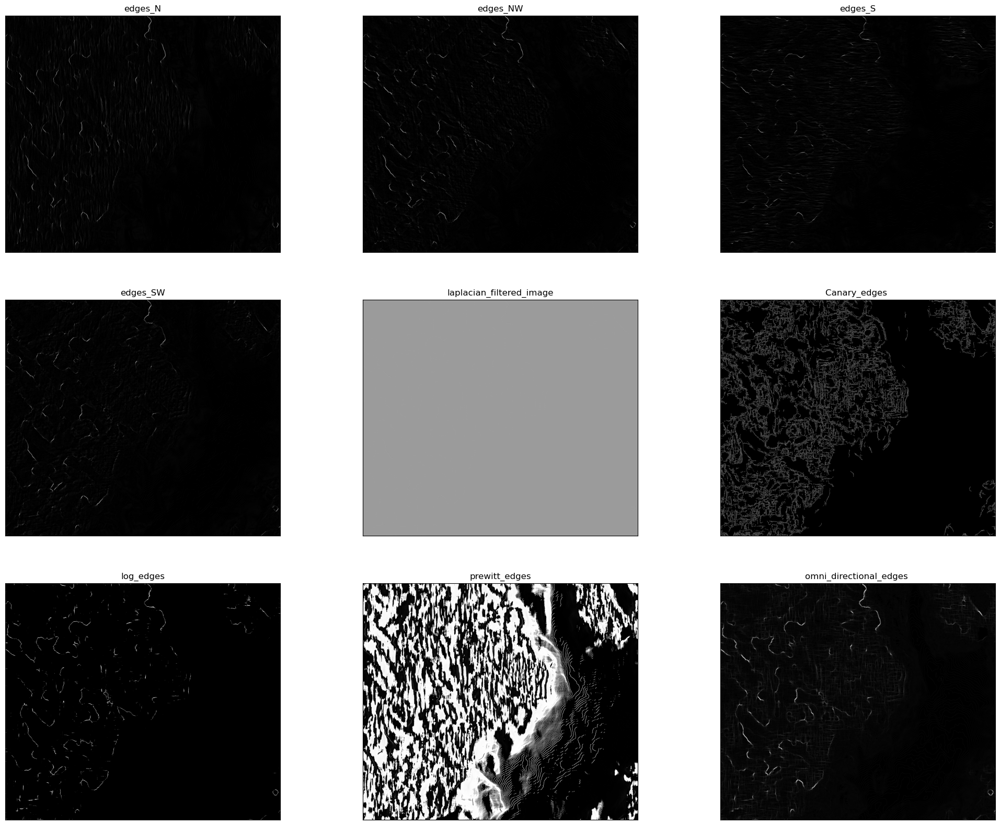

In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image
image = dem_data

k = 65

# Apply Gaussian Blur
# blurred_image = cv2.GaussianBlur(dem_data, (k, k), 0)

if image.dtype != np.uint8:
    image = image.astype(np.uint8)

blurred_image = cv2.medianBlur(image, k)

# Custom kernels 5 * 5 for directional edges
kernel_N = np.array([[-1, -1, 4, -1, -1],
                        [-2, -2, 8, -2, -2],
                        [-3, -3, 12, -3, -3],
                        [-2, -2, 8, -2, -2],
                        [-1, -1, 4, -1, -1]])

kernel_NW = np.array([[4, -1, -1, -2, -3],
                        [-1, 8, -2, -3, -2],
                        [-1, -2, 12, -2, -1],
                        [-2, -3, -2, 8, -1],
                        [-3, -2, -1, -1, 4]])

kernel_S = np.array([[-1, -2, -3, -2, -1],
                        [-1, -2, -3, -2, -1],
                        [4, 8, 12, 8, 4],
                        [-1, -2, -3, -2, -1],
                        [-1, -2, -3, -2, -1]])

kernel_SW = np.array([[-3, -2, -1, -1, 4],
                        [-2, -3, -2, 8, -1],
                        [-1, -2, 12, -2, -1],
                        [-1, 8, -2, -3, -2],
                        [4, -1, -1, -2, -3]])

# Apply kernels
edges_N = cv2.filter2D(blurred_image, -1, kernel_N)
edges_NW = cv2.filter2D(blurred_image, -1, kernel_NW)
edges_S = cv2.filter2D(blurred_image, -1, kernel_S)
edges_SW = cv2.filter2D(blurred_image, -1, kernel_SW)

# Apply kernels
laplacian_filtered_image = cv2.Laplacian(blurred_image, cv2.CV_64F)
Canary_edges = cv2.Canny(blurred_image.astype(np.uint8), threshold1=1, threshold2=20)
log_edges = gaussian_laplace(blurred_image, sigma=1)
prewitt_edges = prewitt(blurred_image)
sobelx = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=5)


# Combine the images by taking the maximum value at each pixel
all_edges = np.stack([edges_N, edges_NW, edges_S, edges_SW])
omni_directional_edges = np.maximum.reduce(all_edges)


plt.figure(figsize=(25, 20))  # Adjusted for better display of two rows

# First row
plt.subplot(331), plt.imshow(edges_N, cmap='gray'), plt.title('edges_N')
plt.xticks([]), plt.yticks([])

plt.subplot(332), plt.imshow(edges_NW, cmap='gray'), plt.title('edges_NW')
plt.xticks([]), plt.yticks([])

plt.subplot(333), plt.imshow(edges_S, cmap='gray'), plt.title('edges_S')
plt.xticks([]), plt.yticks([])

# Second row
plt.subplot(334), plt.imshow(edges_SW, cmap='gray'), plt.title('edges_SW')
plt.xticks([]), plt.yticks([])

plt.subplot(335), plt.imshow(laplacian_filtered_image, cmap='gray'), plt.title('laplacian_filtered_image')
plt.xticks([]), plt.yticks([])

plt.subplot(336), plt.imshow(Canary_edges, cmap='gray'), plt.title('Canary_edges ')
plt.xticks([]), plt.yticks([])

# third row
plt.subplot(337), plt.imshow(log_edges, cmap='gray'), plt.title('log_edges')
plt.xticks([]), plt.yticks([])

plt.subplot(338), plt.imshow(prewitt_edges, cmap='gray'), plt.title('prewitt_edges')
plt.xticks([]), plt.yticks([])

plt.subplot(339), plt.imshow(sobelx, cmap='gray'), plt.title('sobelx')
plt.xticks([]), plt.yticks([])

plt.subplot(339), plt.imshow(sobely, cmap='gray'), plt.title('sobely')
plt.xticks([]), plt.yticks([])

plt.subplot(339), plt.imshow(omni_directional_edges, cmap='gray'), plt.title('omni_directional_edges ')
plt.xticks([]), plt.yticks([])

plt.show()
